# AMR_dataset - Resnet50

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
from torchsummary import summary
import torchinfo
import json
from torchvision.models.segmentation import fcn
import glob
from PIL import Image
import time
from torch.utils.data import DataLoader
import airsim 
from csv import reader

from torch.utils.tensorboard import SummaryWriter

In [2]:
#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device = torch.device("cuda:0")
print("Device chosen GPU:", torch.cuda.get_device_name(device))

# Parameters
num_classes = 5

# Hyper parameters
num_epochs = 50
batch_size = 2
learning_rate = 0.0001
beta1 = 0.9
beta2 = 0.999
log_directory = f"runs/AMR_dataset/resnet50/v0.0.1 Adam lr = {learning_rate}, epochs = {num_epochs}, batchsize ={batch_size}"
writer  = SummaryWriter(log_directory)

Device chosen GPU: NVIDIA TITAN RTX


In [20]:
torch.cuda.empty_cache()
transform = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ]
)

# def pil_to_np(img):
#     return np.array(img) 

# The Cityscapes dataset is avaliable in PyTorch
# train_dataset = torchvision.datasets.Cityscapes(root='./cityscapesDataset', split='train', mode='fine', target_type='semantic', transform=transform, target_transform=pil_to_np)
# #test_dataset  = torchvision.datasets.Cityscapes(root='./cityscapesDataset', split='test',  mode='fine', target_type='semantic', transform=pil_to_tensor, target_transform=transforms.ToTensor())
# val_dataset   = torchvision.datasets.Cityscapes(root='./cityscapesDataset', split='val',   mode='fine', target_type='semantic', transform=transform, target_transform=pil_to_np)

# DATA_DIRECTORY = "AirSimDataset/"
# airSimDataset = np.load(DATA_DIRECTORY)
# print(airSimDataset)

with open('AMR_dataset/filtered_dataset.csv', 'r') as read_obj: # https://thispointer.com/python-read-csv-into-a-list-of-lists-or-tuples-or-dictionaries-import-csv-to-list/
    # pass the file object to reader() to get the reader object
    csv_reader = reader(read_obj)
    # Pass reader object to list() to get a list of lists
    list_of_rows = np.array(list(csv_reader))
    #print('Shape of both:', list_of_rows.shape)
    file_list_images  = list_of_rows[1:,0]
    file_list_targets = list_of_rows[1:,1]
    #print('Path:', file_list_images)


# Help with glob from https://stackoverflow.com/questions/39195113/how-to-load-multiple-images-in-a-numpy-array
#file_list_images  = sorted(glob.glob('AirSimDataset4/img_rgbd_camera_0_*.png'))
#file_list_targets = sorted(glob.glob('AirSimDataset4/img_rgbd_camera_5_*.png'))

dataset_images  = np.array([np.array(Image.open(filename)) for filename in file_list_images])#.permute(0,3,1,2)
dataset_targets = np.array([np.array(Image.open(filename)) for filename in file_list_targets])#.permute(0,3,1,2)
# dataset_images  = torch.tensor([np.array(Image.open(filename)) for filename in file_list_images], device=device)
# dataset_targets = torch.tensor([np.array(Image.open(filename)) for filename in file_list_targets], device=device)

# print("Images  shape:", dataset_images.shape)
# print("Targets shape:", dataset_targets.shape)
dataset_images = torch.tensor(dataset_images[:,1:-1,1:-1,0:3], device=device).permute(0,3,1,2)  # [:,1:-1,1:-1,0:3] ignores edge pixels on all sides of the image, and 0:3 ignores the alpha value
dataset_targets = torch.tensor(dataset_targets[:,1:-1,1:-1,0], device=device)
with torch.no_grad():
    #dataset_images = [transform(img) for img in dataset_images]

    # From 3 channel RGB targets into 1

    ## CPU
    # start0 = time.perf_counter()
    # targets = np.zeros(targets_RGB.shape[:3])
    # class_colors = [
    #     #np.array([0, 0, 0]),   # new_targets are already zero
    #     np.array([81, 38, 0]),  # Toilet
    #     np.array([41, 36, 132]) # Chair
    # ]

    # for i, class_color in enumerate(class_colors):                  # For every class/colour 
    #     indice = np.where(np.all(targets_RGB == class_color, axis=-1))   # Where the current RGB value corresponds with hte pixel in the last axis
    #     targets[indice] = i+1        # Use that pixel index to define class number from enumerate. The +1 is due to 0 being background
    # print(f"time0: {time.perf_counter() - start0}")

    ## GPU
    #start = time.perf_counter()

    #     #color0 = torch.tensor([0, 0, 0], device=device)
    #     color1 = torch.tensor([81, 38, 0], device=device)
    #     color2 = torch.tensor([41, 36, 132], device=device)
    #     color_map = [color1, color2]

    #     torch_targets_RGB = torch.tensor(targets_RGB, device=device)
    #     # Create target on the gpu
    #     targets = torch.zeros(targets_RGB.shape[:3], device=device)
    #     # convert to torch tensor and put it on gpu
    #     #mid = time.perf_counter()
    #     #print(f"time gpu moving: {mid - start}")
    #     for i, c in enumerate(color_map):
    #         # find all pixel equal to the color
    #         indices = torch.where(torch.all(torch_targets_RGB == c, dim=-1))
    #         # set class
    #         targets[indices] = i + 1
    #     #print(f"time: {time.perf_counter() - mid}")

    #     #targets = torch.unsqueeze(targets, dim=-1)
    #     images = torch.tensor(images, device=device).permute(0,3,1,2) # Permutes from [84, 720, 1280, 3] to [84, 3, 720, 1280], as that's how PyTorch likes it

    # Pairing the images with the labels - train to test ratio of 5 to 1

    num_test = int(len(dataset_targets)/5) # will return 1/5 integer of the total sample size   
    # train_data = (images[num_test:len(targets)], targets[num_test:len(targets)])
    # test_data = (images[:num_test], targets[:num_test])
    train_data = [(img, t) for img, t in zip(dataset_images[num_test:len(dataset_targets)], dataset_targets[num_test:len(dataset_targets)])]
    test_data  = [(img, t) for img, t in zip(dataset_images[:num_test], dataset_targets[:num_test])]


    # train_data = train_data[:,:,:,:3]
    # test_data  = test_data[:,:,:,:1]

    # Dataloaders used to batch the paired images
    #train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    #test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)


    # Splitting the training and testing datasets into smaller batches
    # workers = 5
    train_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True)#,  num_workers=workers)#, pin_memory=True))
    test_loader  = torch.utils.data.DataLoader(dataset=test_data,  batch_size=batch_size, shuffle=False)#, num_workers=workers)#, pin_memory=True))
    #val_loader   = torch.utils.data.DataLoader(dataset=test_data,  batch_size=batch_size, shuffle=False)#, num_workers=workers)#, pin_memory=True))

    #print('Train Size: ', len(train_dataset))
    #print('Test Size : ', len(test_dataset))
    #print('Val Size  : ', len(val_dataset))

    # print('train_data', train_data.shape)
    # print('dataset_targets', dataset_targets.shape)

    print('dataset_images: ', dataset_images.shape)
    print('dataset_targets:', dataset_targets.shape)

    '''Plot from dataset'''
    # fig, ax = plt.subplots(nrows=2,ncols=2, figsize=(24, 16))
    # ax[0][0].imshow(dataset_images[0])
    # ax[0][1].imshow(dataset_targets[0])
    # ax[1][0].imshow(dataset_images[83])
    # ax[1][1].imshow(dataset_targets[83])

    '''Plot from dataset'''
    # fig, ax = plt.subplots(nrows=2,ncols=2, figsize=(24, 16))
    # ax[0][0].imshow(dataset_images[0].to('cpu').permute(1,2,0))
    # ax[0][1].imshow(dataset_targets[0].to('cpu'))
    # ax[1][0].imshow(dataset_images[83].to('cpu').permute(1,2,0)) #.permute(1,2,0)
    # ax[1][1].imshow(dataset_targets[83].to('cpu'))

    #'''Plot from dataloader''';
    plot_img, plot_target = iter(train_loader).next()
    plot_img = plot_img[0]
    plot_target = plot_target[0]
    fig, ax = plt.subplots(ncols=2, figsize=(24, 16))
    ax[0].imshow(np.array(plot_img.to('cpu')).transpose(1,2,0)) # transpose(1,2,0) changes the order of the dimensions
    ax[1].imshow(np.array(plot_target.to('cpu')))

TypeError: pic should be PIL Image or ndarray. Got <class 'torch.Tensor'>

In [14]:
dataset_images[0,:,0,0]
dataset_images.shape

torch.Size([106, 3, 718, 1278])

(array([[  0.,   0.,  12., ..., 153., 184.,   1.],
        [ 10.,   6.,  77., ..., 117., 140.,   0.],
        [  1.,   9.,  36., ...,  96., 134.,   0.],
        ...,
        [ 80.,   3.,   8., ...,   0.,   0.,   0.],
        [ 79.,   5.,   5., ...,   0.,   0.,   0.],
        [ 77.,   5.,   9., ...,   0.,   0.,   0.]]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <a list of 718 BarContainer objects>)

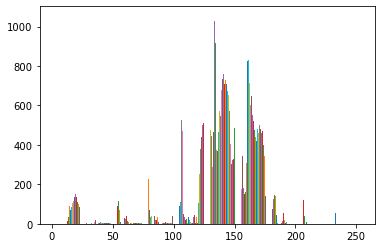

In [15]:
plt.hist(dataset_images[0,0,:,:].to('cpu'))

In [4]:
# Find all class RGB values in an image
# img_target = dataset_images[0] # opencv uses GBR
# img_target_RGB = img_target
# print(img_target.shape)
# # np.where(np.all(img_target == np.array()))
# h, w = img_target_RGB.shape[:2]
# colors=[]
# for x in range(w):
#     for y in range(h):
#         pixel = img_target[y,x]
#         if str(pixel) not in colors:
#             colors.append(str(pixel))

# print(colors)

print(len(test_data))
print(len(train_data))

21
85


In [5]:
'''Loading saved model''';
# model = fcn.fcn_resnet50(pretrained=False, progress=True, num_classes=num_classes, aux_loss=False, pretrained_backbone=True).to(device)
# optimiser = torch.optim.Adam(model.parameters(), lr=learning_rate, betas=[beta1, beta2], eps=1e-08)

# loaded_checkpoint = torch.load("UPDATE PATH")

# # for param in model.parameters():    # Freezing the startign layers
# #     # param.requires_grad = False
# #     param.requires_grad = False

# model.load_state_dict(loaded_checkpoint["model_state"])
# optimiser.load_state_dict(loaded_checkpoint["optimiser_state"])
# epoch = loaded_checkpoint["epoch"]
# criterion = nn.CrossEntropyLoss()

In [6]:
'''Loading new model''';
model = fcn.fcn_resnet50(pretrained=False, progress=True, num_classes=num_classes, aux_loss=False, pretrained_backbone=True).to(device)

# Finetuning
# for param in model.parameters():    # Freezing/unfreezing the starting layers
#     # param.requires_grad = False
#     param.requires_grad = False

optimiser = torch.optim.Adam(model.parameters(), lr=learning_rate, betas=[beta1, beta2], eps=1e-8)
criterion = nn.CrossEntropyLoss()


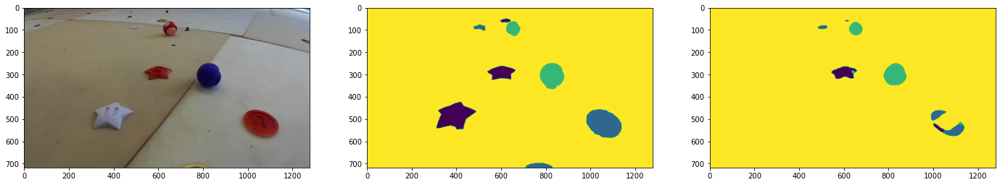

Epoch 39/50, step 35/43, loss = 0.00350


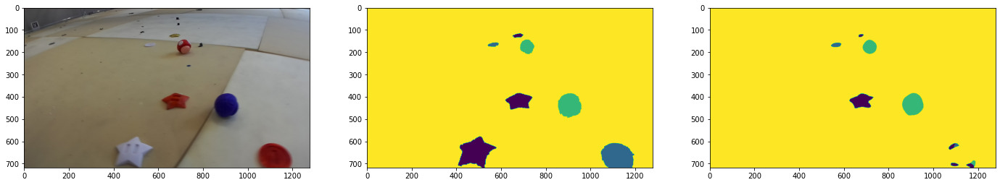

Epoch 39/50, step 40/43, loss = 0.00466


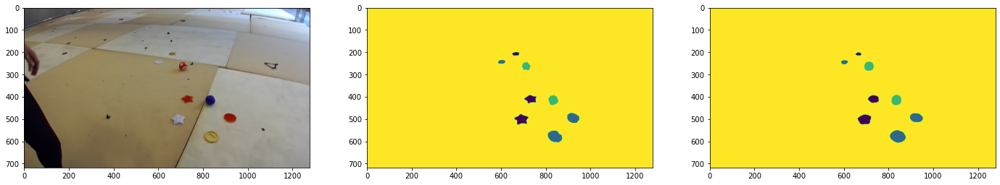

Epoch 40/50, step 5/43, loss = 0.00341


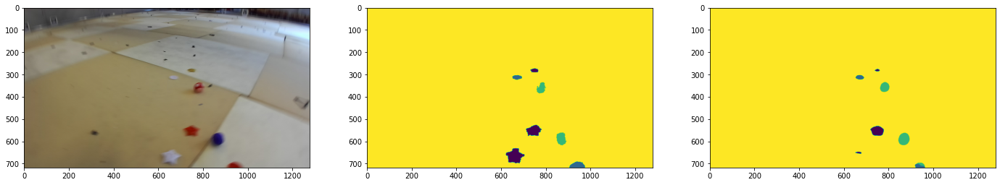

Epoch 40/50, step 10/43, loss = 0.00451


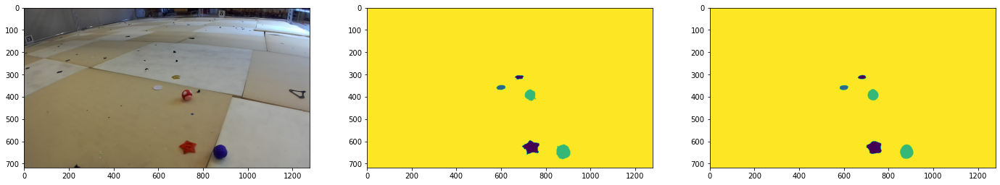

Epoch 40/50, step 15/43, loss = 0.00310


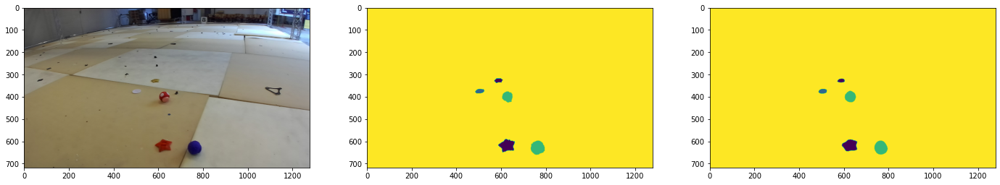

Epoch 40/50, step 20/43, loss = 0.00715


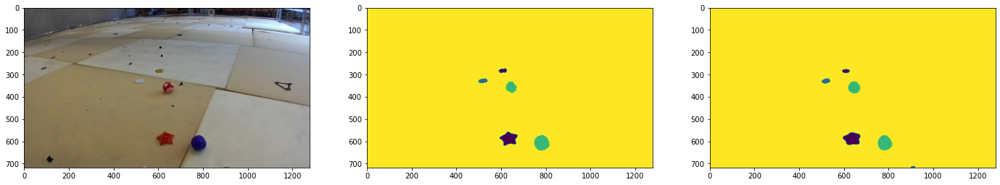

Epoch 40/50, step 25/43, loss = 0.00359


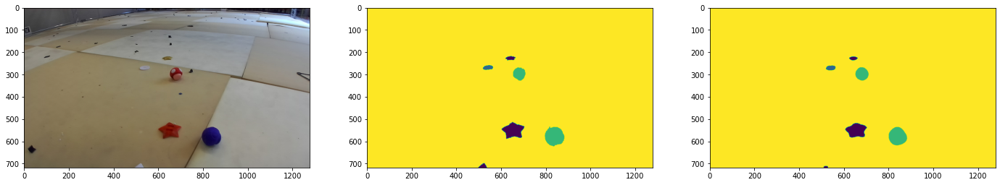

Epoch 40/50, step 30/43, loss = 0.00356


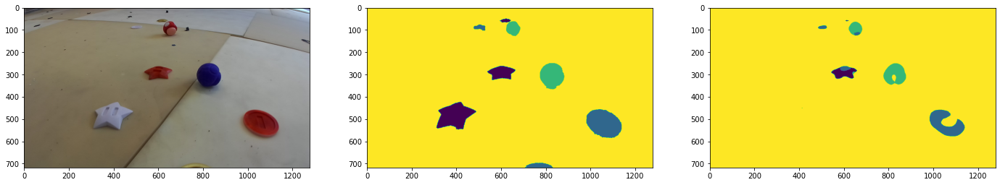

Epoch 40/50, step 35/43, loss = 0.00213


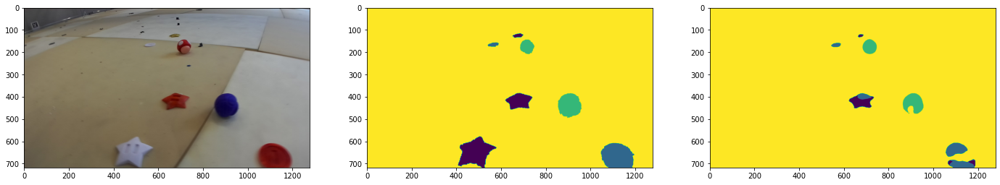

Epoch 40/50, step 40/43, loss = 0.00329


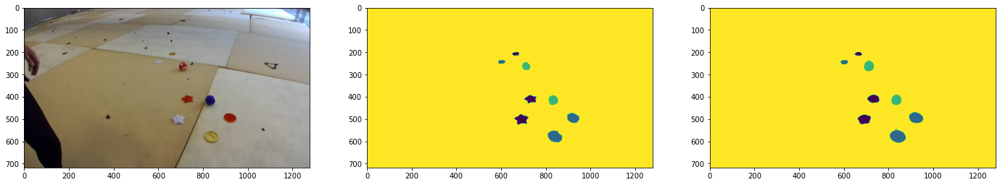

Epoch 41/50, step 5/43, loss = 0.00462


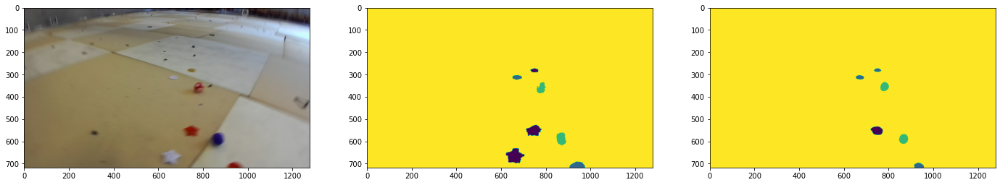

Epoch 41/50, step 10/43, loss = 0.00327


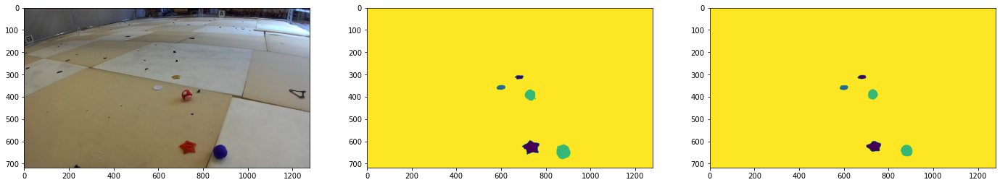

Epoch 41/50, step 15/43, loss = 0.00530


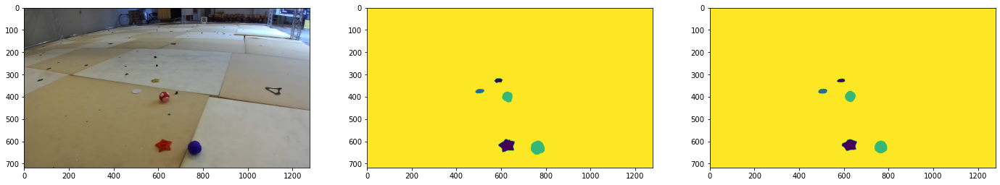

Epoch 41/50, step 20/43, loss = 0.00314


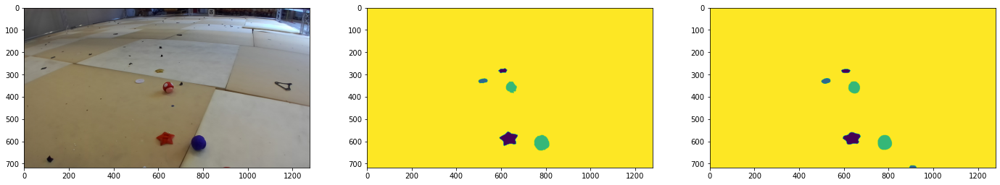

Epoch 41/50, step 25/43, loss = 0.00533


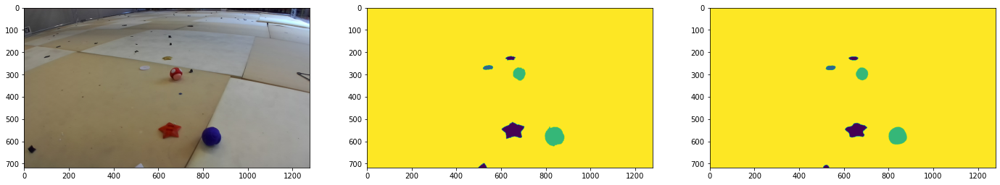

Epoch 41/50, step 30/43, loss = 0.00347


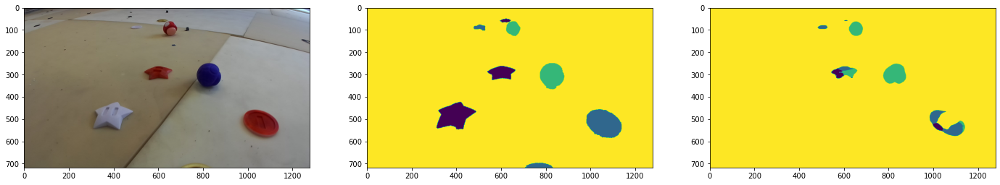

Epoch 41/50, step 35/43, loss = 0.00466


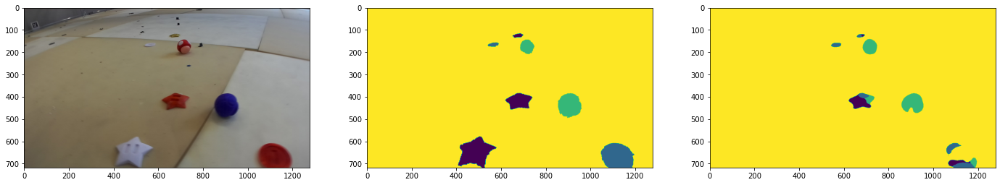

Epoch 41/50, step 40/43, loss = 0.00359


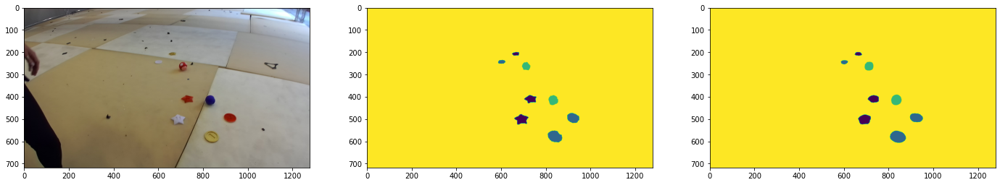

Epoch 42/50, step 5/43, loss = 0.00336


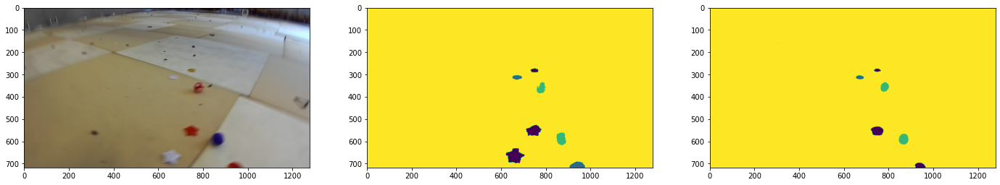

Epoch 42/50, step 10/43, loss = 0.00319


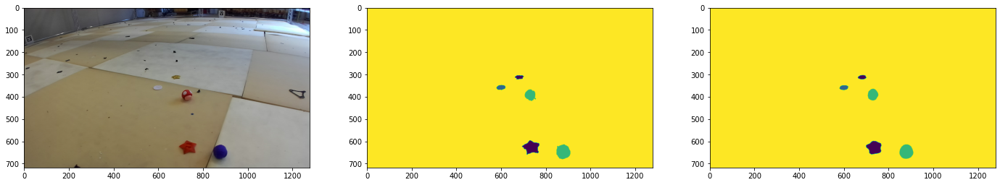

Epoch 42/50, step 15/43, loss = 0.00369


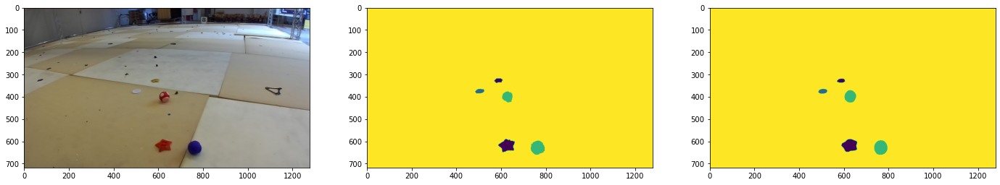

Epoch 42/50, step 20/43, loss = 0.00505


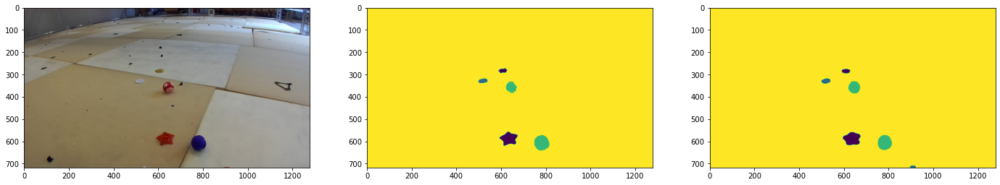

Epoch 42/50, step 25/43, loss = 0.00504


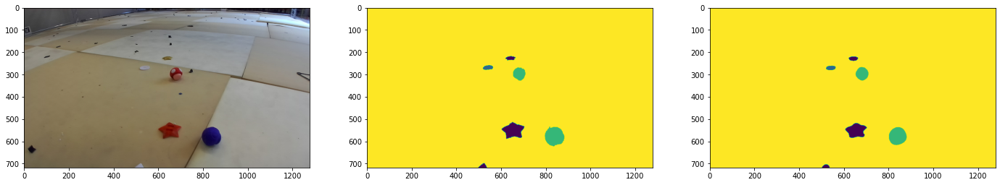

Epoch 42/50, step 30/43, loss = 0.00413


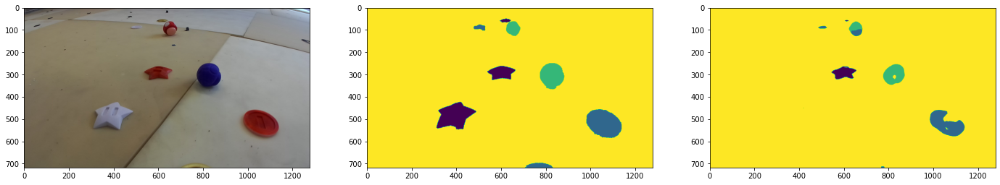

Epoch 42/50, step 35/43, loss = 0.00326


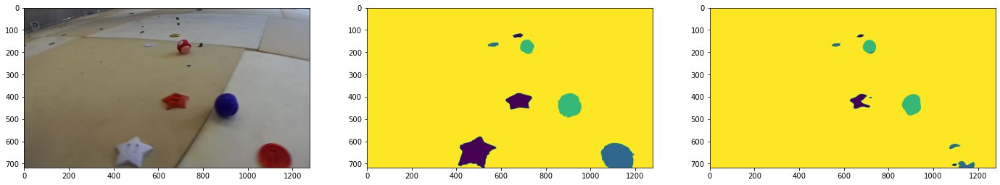

Epoch 42/50, step 40/43, loss = 0.00351


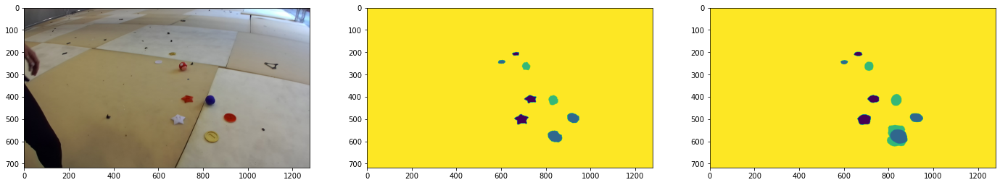

Epoch 43/50, step 5/43, loss = 0.00381


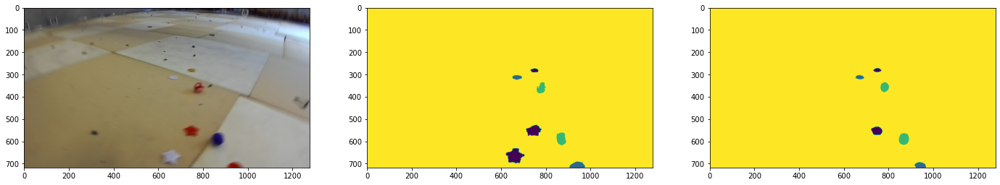

Epoch 43/50, step 10/43, loss = 0.00330


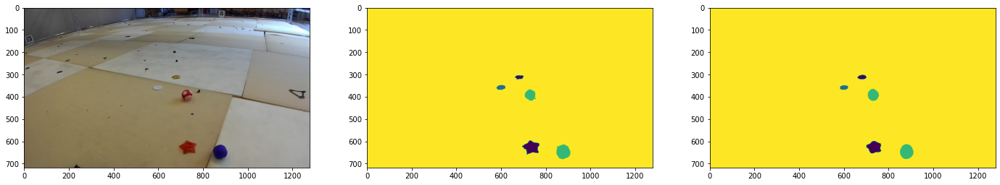

Epoch 43/50, step 15/43, loss = 0.00561


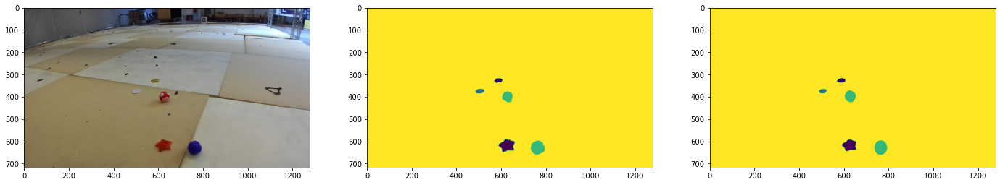

Epoch 43/50, step 20/43, loss = 0.67364


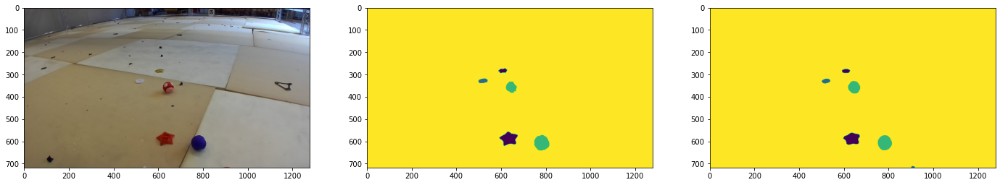

Epoch 43/50, step 25/43, loss = 0.00551


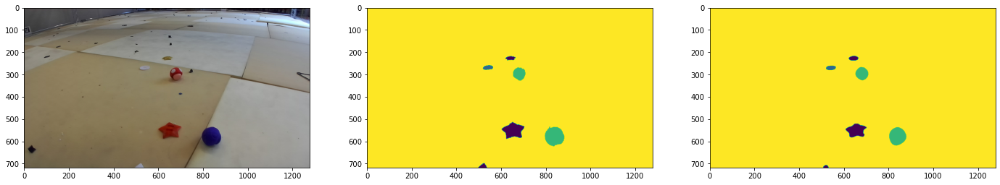

Epoch 43/50, step 30/43, loss = 0.00409


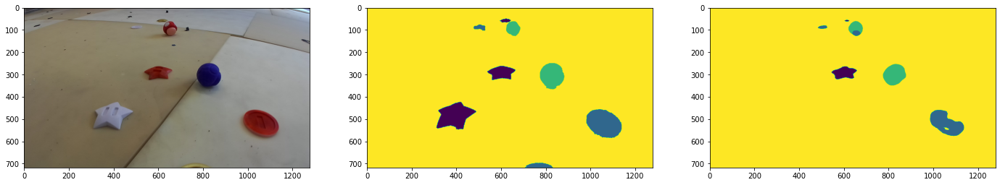

Epoch 43/50, step 35/43, loss = 0.00442


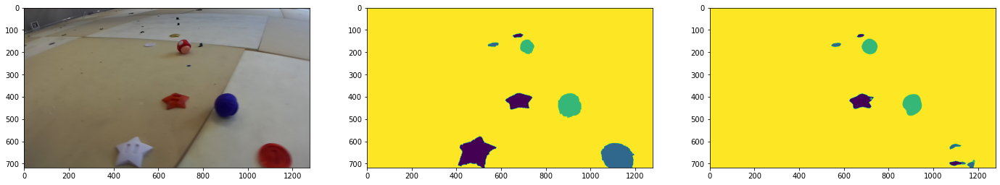

Epoch 43/50, step 40/43, loss = 0.00526


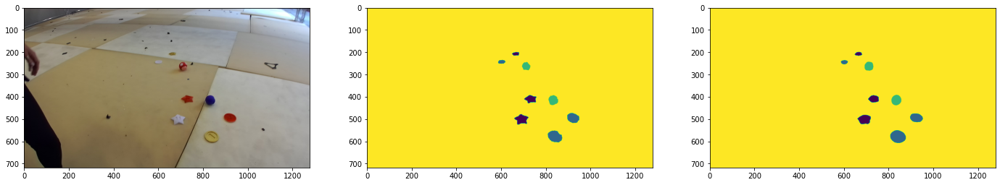

Epoch 44/50, step 5/43, loss = 0.00694


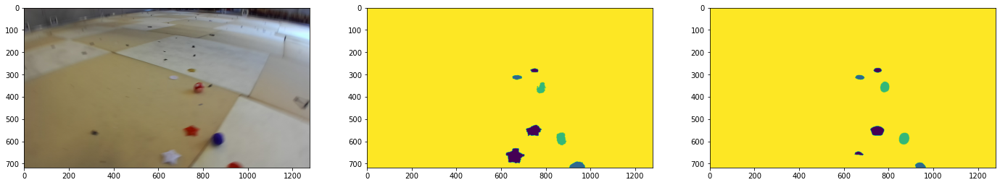

Epoch 44/50, step 10/43, loss = 0.00377


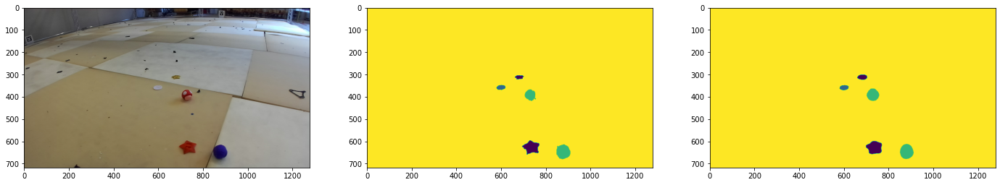

Epoch 44/50, step 15/43, loss = 0.00546


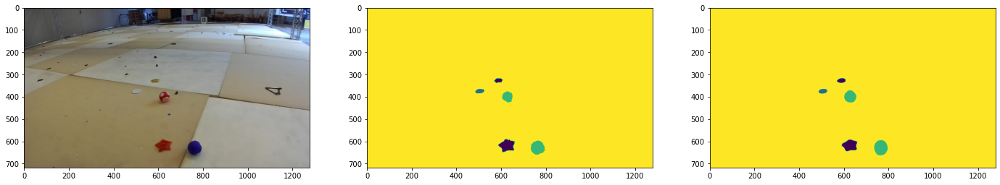

Epoch 44/50, step 20/43, loss = 0.00341


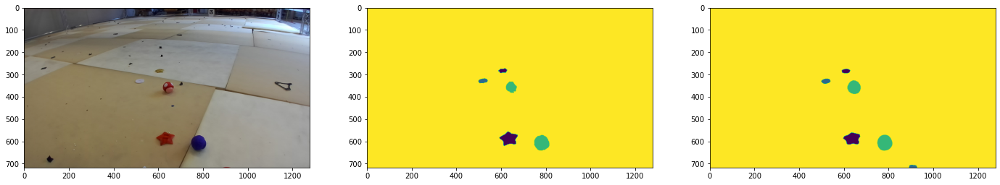

Epoch 44/50, step 25/43, loss = 0.00437


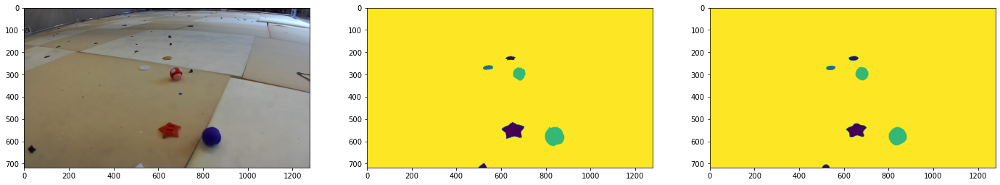

Epoch 44/50, step 30/43, loss = 0.00443


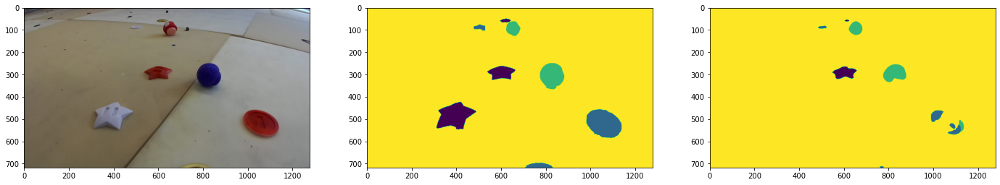

Epoch 44/50, step 35/43, loss = 0.00433


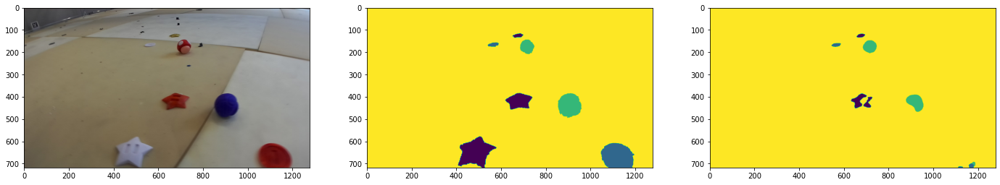

Epoch 44/50, step 40/43, loss = 0.00388


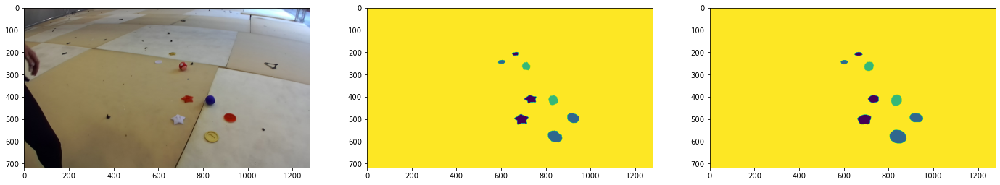

Epoch 45/50, step 5/43, loss = 0.00431


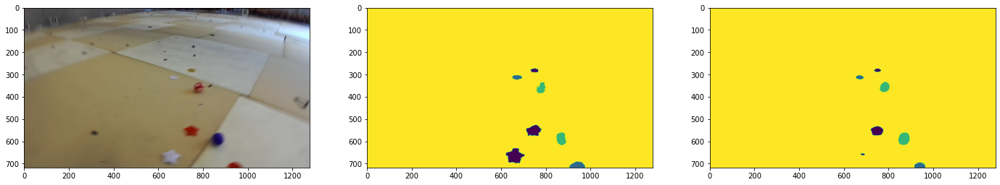

Epoch 45/50, step 10/43, loss = 0.00543


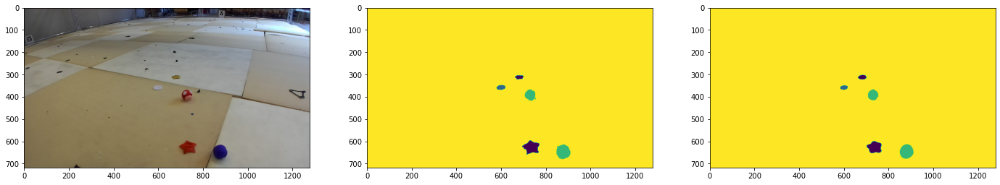

Epoch 45/50, step 15/43, loss = 0.00457


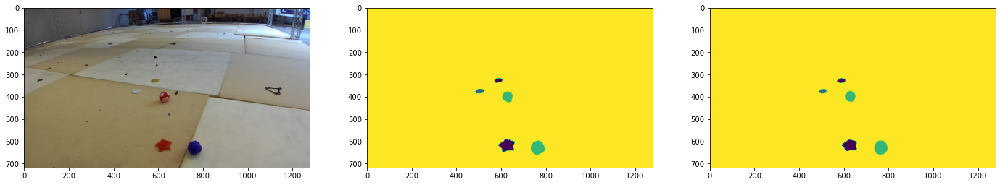

Epoch 45/50, step 20/43, loss = 0.00363


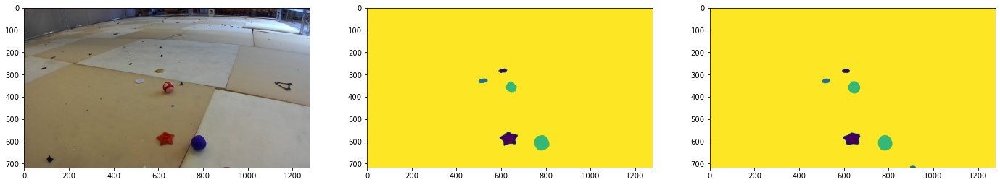

Epoch 45/50, step 25/43, loss = 0.00535


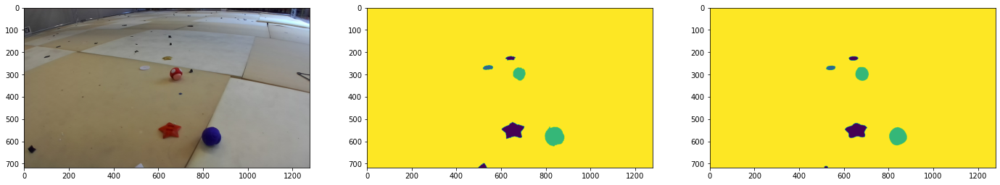

Epoch 45/50, step 30/43, loss = 0.00569


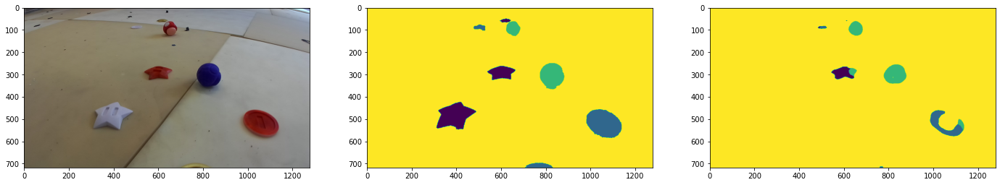

Epoch 45/50, step 35/43, loss = 0.00340


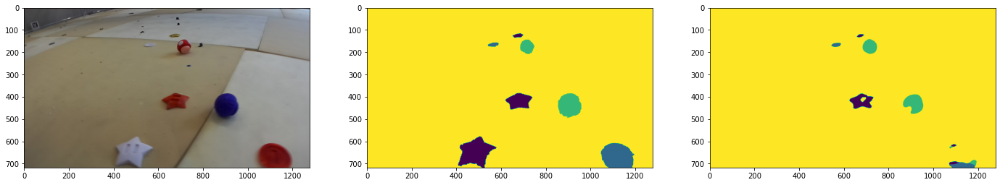

Epoch 45/50, step 40/43, loss = 0.00319


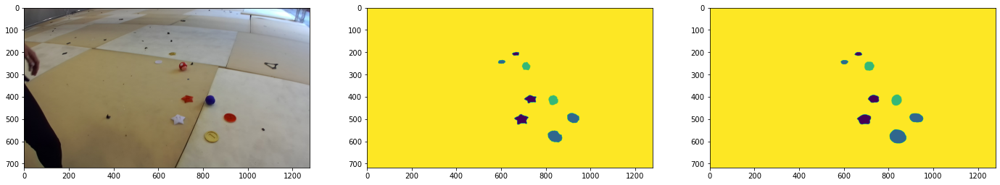

Epoch 46/50, step 5/43, loss = 0.00383


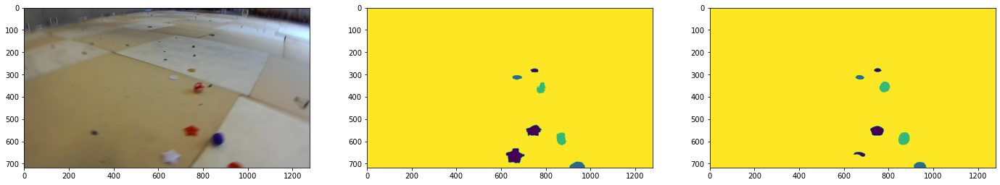

Epoch 46/50, step 10/43, loss = 0.00341


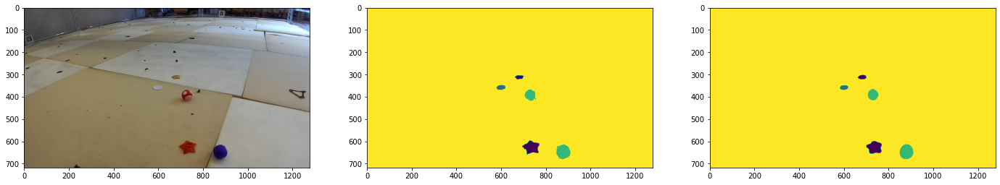

Epoch 46/50, step 15/43, loss = 0.00399


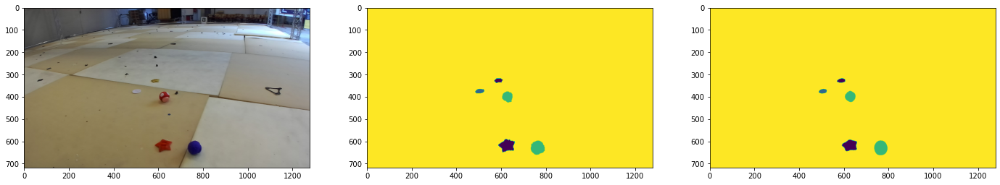

Epoch 46/50, step 20/43, loss = 0.00347


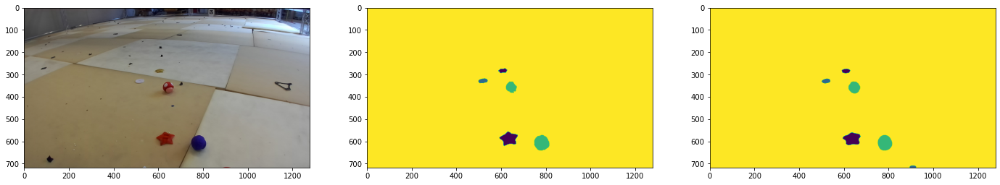

Epoch 46/50, step 25/43, loss = 0.00319


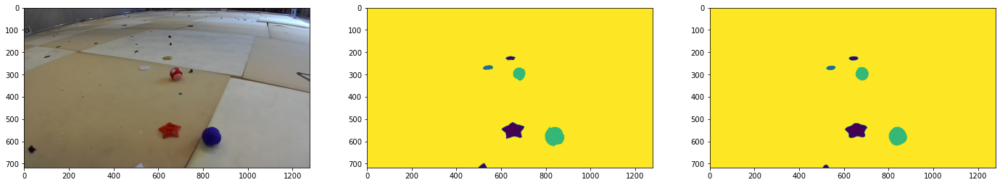

Epoch 46/50, step 30/43, loss = 0.00334


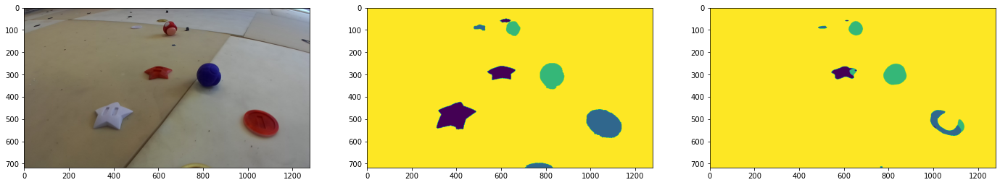

Epoch 46/50, step 35/43, loss = 0.00314


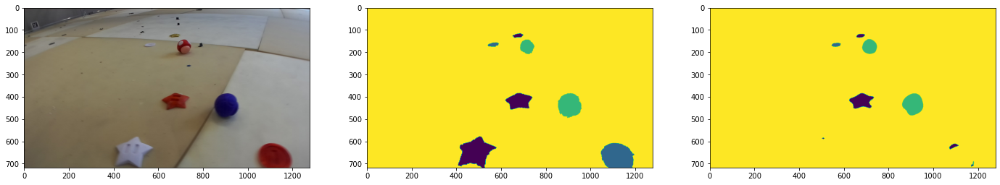

Epoch 46/50, step 40/43, loss = 0.00218


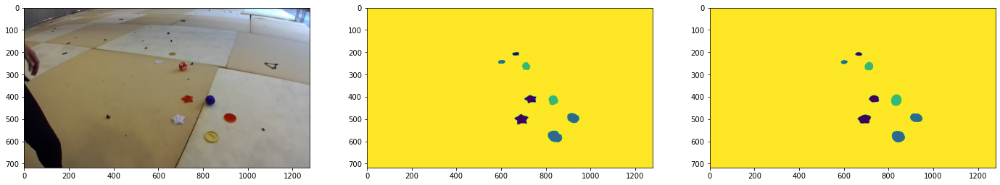

Epoch 47/50, step 5/43, loss = 0.00611


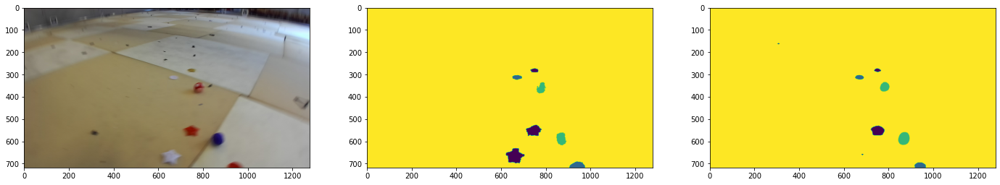

Epoch 47/50, step 10/43, loss = 0.00376


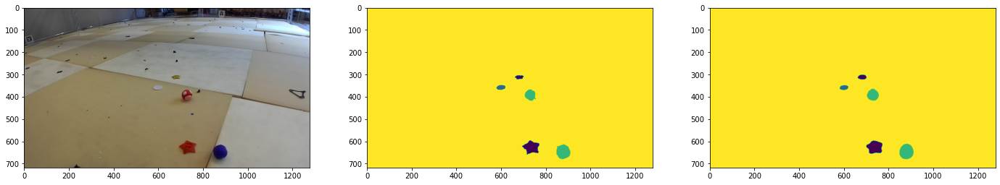

Epoch 47/50, step 15/43, loss = 0.00333


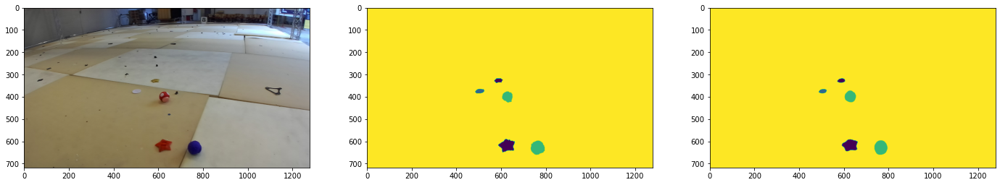

Epoch 47/50, step 20/43, loss = 0.00272


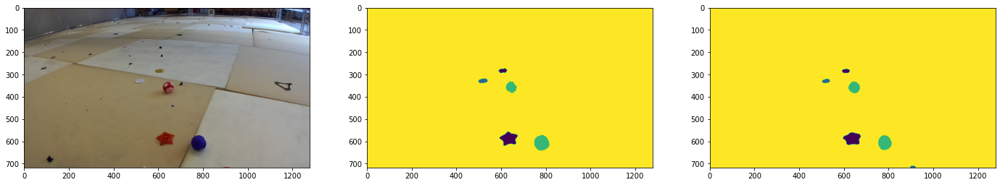

Epoch 47/50, step 25/43, loss = 0.00517


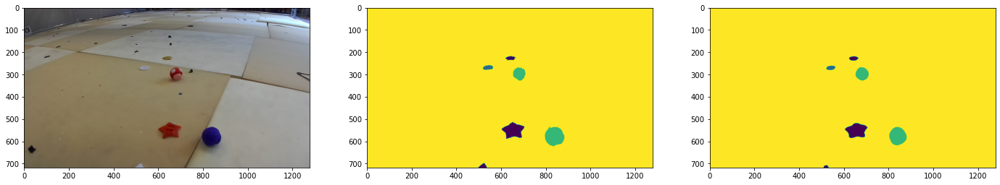

Epoch 47/50, step 30/43, loss = 0.00427


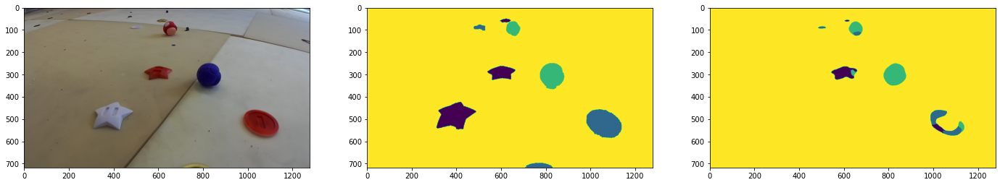

Epoch 47/50, step 35/43, loss = 0.00319


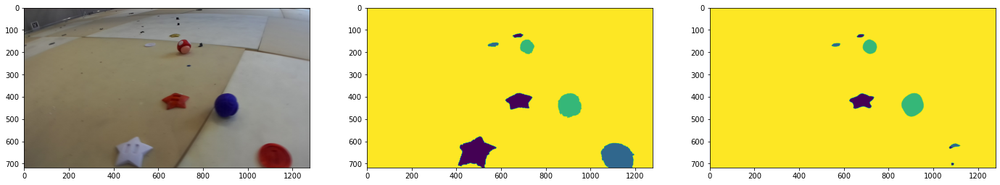

Epoch 47/50, step 40/43, loss = 0.00436


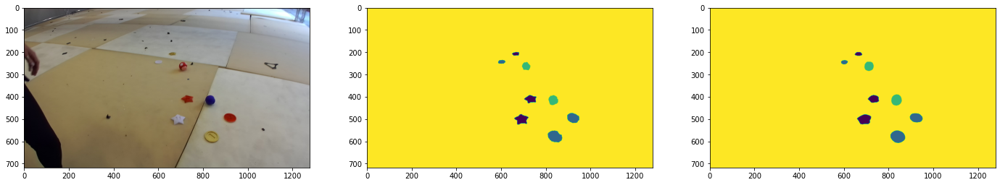

Epoch 48/50, step 5/43, loss = 0.00506


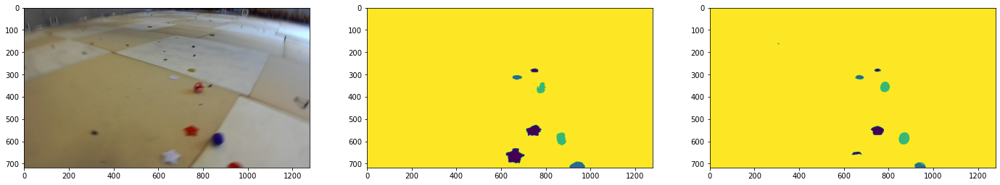

Epoch 48/50, step 10/43, loss = 0.00330


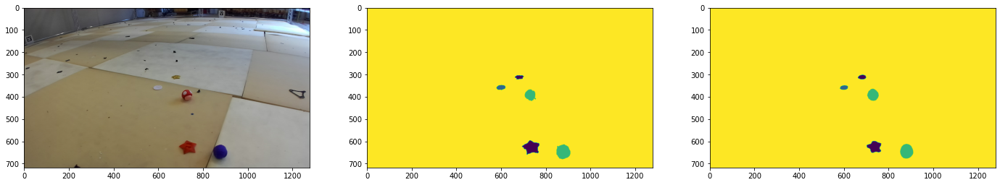

Epoch 48/50, step 15/43, loss = 0.00336


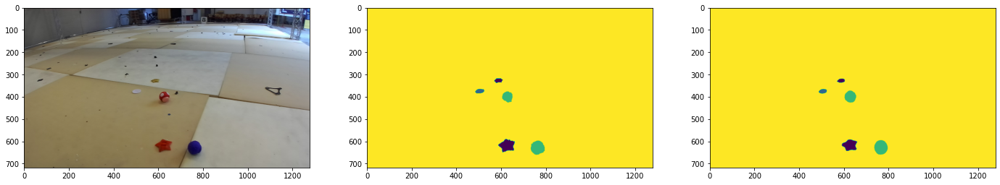

Epoch 48/50, step 20/43, loss = 0.00432


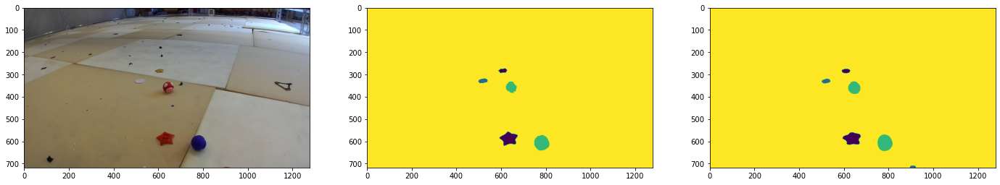

Epoch 48/50, step 25/43, loss = 0.00329


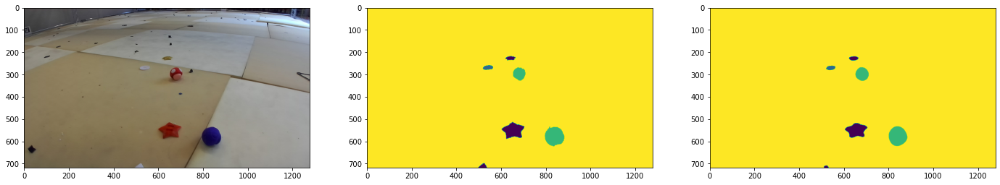

Epoch 48/50, step 30/43, loss = 0.00291


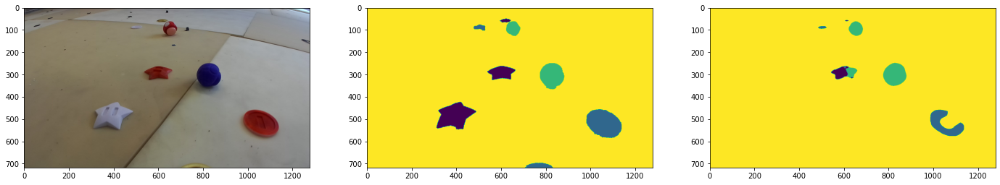

Epoch 48/50, step 35/43, loss = 0.00375


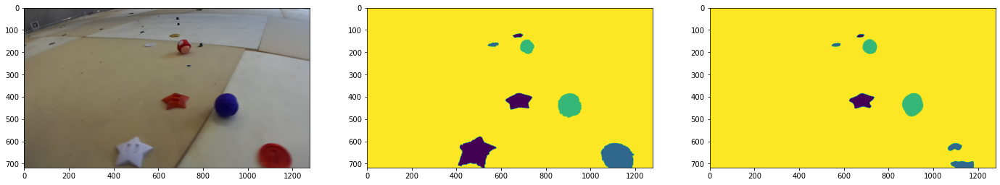

Epoch 48/50, step 40/43, loss = 0.00334


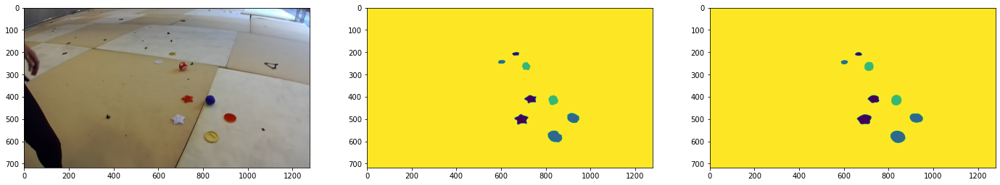

Epoch 49/50, step 5/43, loss = 0.00258


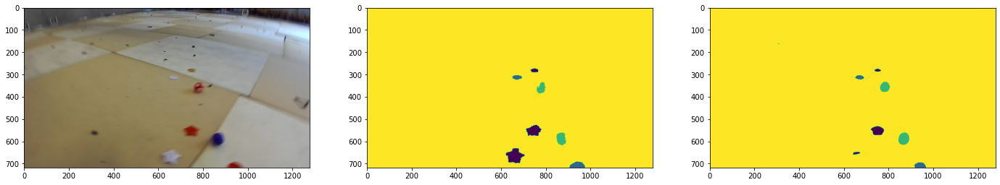

Epoch 49/50, step 10/43, loss = 0.00341


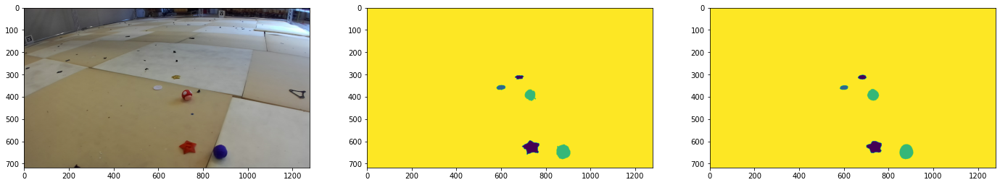

Epoch 49/50, step 15/43, loss = 0.00279


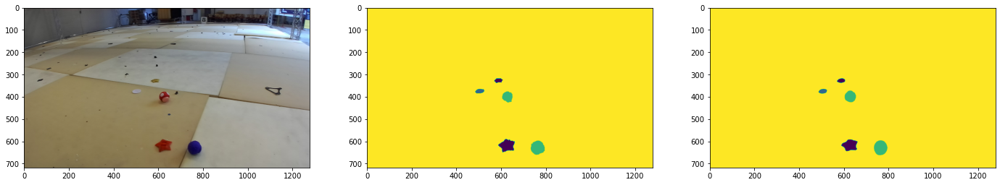

Epoch 49/50, step 20/43, loss = 0.00315


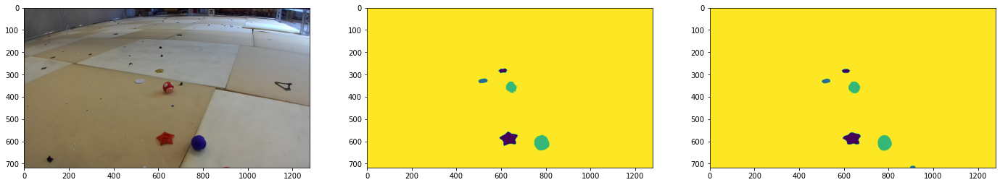

Epoch 49/50, step 25/43, loss = 0.00428


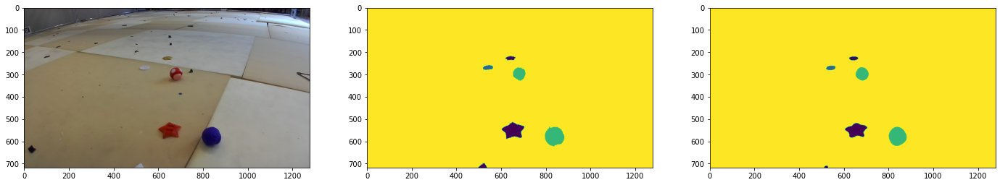

Epoch 49/50, step 30/43, loss = 0.00331


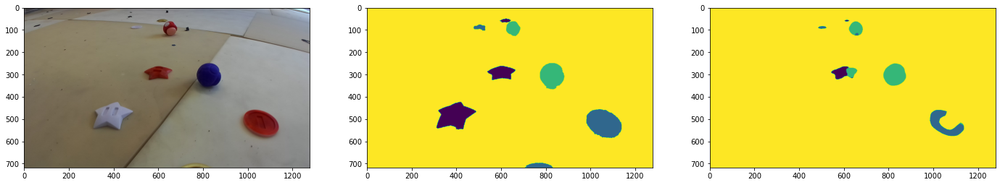

Epoch 49/50, step 35/43, loss = 0.00271


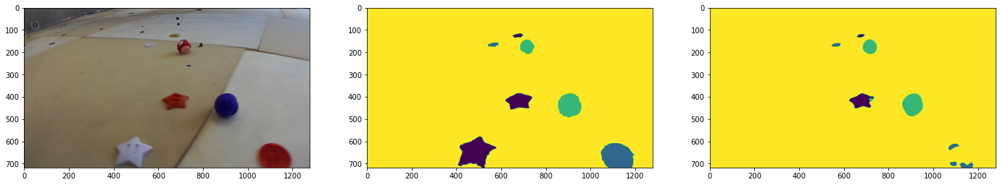

Epoch 49/50, step 40/43, loss = 0.00336


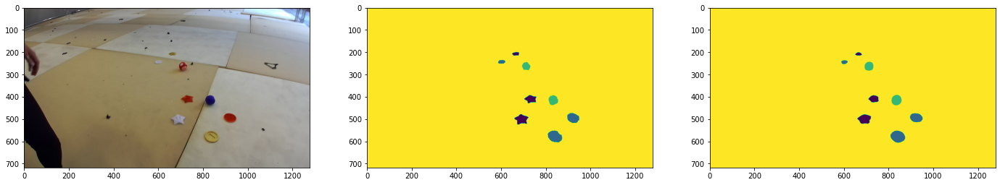

Epoch 50/50, step 5/43, loss = 0.00345


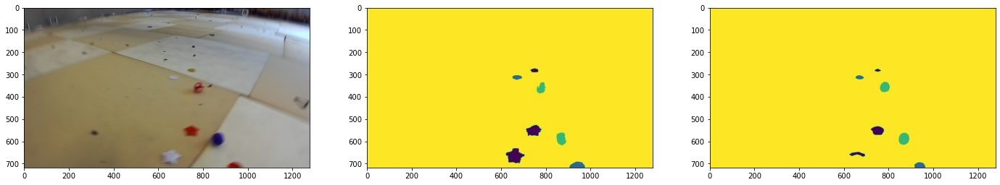

Epoch 50/50, step 10/43, loss = 0.00279


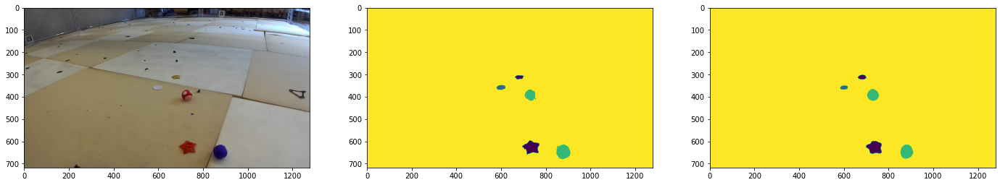

Epoch 50/50, step 15/43, loss = 0.00331


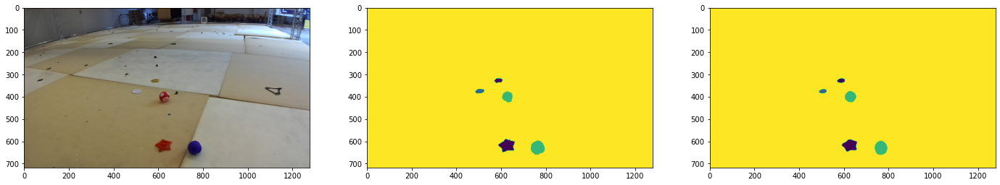

Epoch 50/50, step 20/43, loss = 0.00260


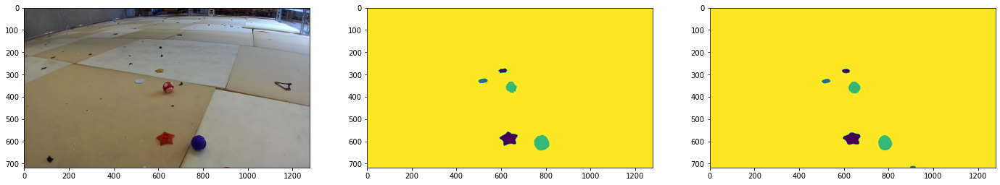

Epoch 50/50, step 25/43, loss = 0.00283


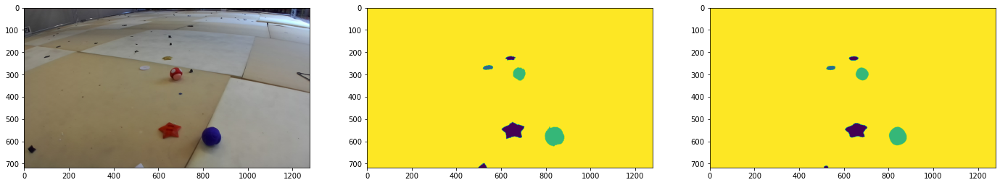

Epoch 50/50, step 30/43, loss = 0.00404


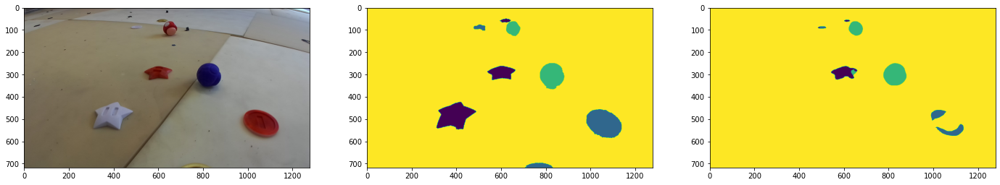

Epoch 50/50, step 35/43, loss = 0.00317


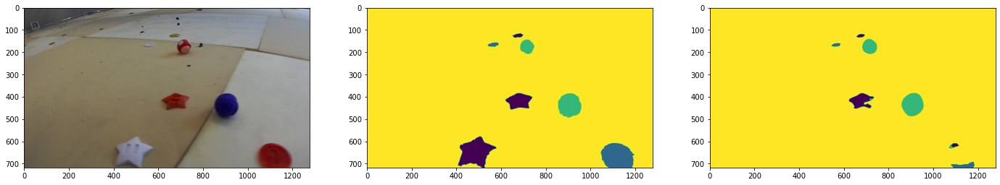

Epoch 50/50, step 40/43, loss = 0.00264
Training is done


In [7]:
'''Training'''
# Tensorboard
#writer.add_graph(model.cpu(), val_dataset[0][0])
#writer.close()

# Doing the training now

n_total_steps = len(train_loader)

steps_until_print = batch_size

# stop_training = False
# def signal_handler(sig, frame):
#     print('\nDetected Ctrl+C, stopping training')
#     stop_training = True
#     print('Saving model')
# signal.signal(signal.SIGINT, signal_handler)

model.train()
print('Starting training')
for epoch in range(num_epochs):
    #if stop_training: break

    # Check for stop - read file for boolean to stopping safely
    with open("train.json") as train_json:
        train_dict = json.load(train_json)
        if train_dict["train"] == "False": break

    testing_batches = iter(test_loader) # Every epoch tests the whole dataset once

    for i, (images, targets) in enumerate(train_loader):
            # Check for stop - read file for boolean to stopping safely
        with open("train.json") as train_json:
            train_dict = json.load(train_json)
            if train_dict["train"] == "False": break

        images = images.to(device, torch.float32)
        targets = targets.to(device)
        # print('images  shape:', images.shape)
        # print('targets shape:', targets.shape)

        # Forward pass
        outputs = model(images)['out']
        # print("outputs shape:", outputs.shape)
      
        loss = criterion(outputs, targets.long())

        # Backward pass
        optimiser.zero_grad()   # Clear old gradient values
        loss.backward()         # Calculate the gradients
        optimiser.step()        # Update the model's weights - seen at model.parameters()

        with torch.no_grad():

            # Logging the train accuracy
            pred = torch.argmax(outputs, dim=1)     # Evaluate along the 1st dimension
            batch_pixel_accuracy = (pred == targets).sum().item()/(batch_size*pred.shape[1]*pred.shape[2])
            writer.add_scalar('Accuracy/training', batch_pixel_accuracy, epoch * n_total_steps + i) # label of the scalar, actual loss mean, current global step 

            # Logging the train loss
            writer.add_scalar('Loss/training', loss.item()/steps_until_print, epoch * n_total_steps + i) # label of the scalar, actual loss mean, current global step

            # For every 5 batches, test one batch. (test:train data ratio is split 1:5)
            if (i+1) % 5 == 0:  # Logging the testing loss
                test_images, test_targets = testing_batches.next()
                
                test_images = test_images.to(device)
                test_targets = test_targets.to(device)#.squeeze(1)

                model.eval()
                test_outputs = model(test_images.float())['out']
                model.train()
                    
                test_pred = torch.argmax(test_outputs, dim=1)

                '''Plot test results'''
                fig, ax = plt.subplots(ncols=3, figsize=(24, 16))
                ax[0].imshow(test_images[0].to('cpu', torch.uint8).permute(1,2,0)) # transpose(1,2,0) changes the order of the dimensions
                ax[1].imshow(test_targets[0].to('cpu'))
                ax[2].imshow(test_pred[0].to('cpu').detach())
                plt.pause(0.01)
                '''                     '''

                # print('test_images  shape:', test_images.shape)
                # print('test_targets shape:', test_targets.shape)
                # print('test_outputs shape:', test_outputs.shape)
                # print('test_pred    shape:', test_pred.shape)

                # writer.add_images('test/images',      test_images                  , epoch * n_total_steps + i)
                # writer.add_images('test/targets',     test_targets.unsqueeze(dim=1), epoch * n_total_steps + i)
                # writer.add_images('test/predictions', test_pred.unsqueeze(dim=1)   , epoch * n_total_steps + i)

                # Logging the test accuracy
                test_batch_pixel_accuracy = (test_pred == test_targets).sum().item()/(batch_size*test_pred.shape[1]*test_pred.shape[2])
                #print('Test batch pixel accuracy', test_batch_pixel_accuracy)
                writer.add_scalar('Accuracy/testing', test_batch_pixel_accuracy, epoch * n_total_steps + i) # label of the scalar, actual loss mean, current global step 

                # Logging the test loss
                test_loss = criterion(test_outputs, test_targets.long())
                writer.add_scalar('Loss/testing', test_loss.item()/len(test_targets), epoch * n_total_steps + i) # label of the scalar, actual loss mean, current global step

                #writer.add_scalars("Accuracy", {"train": batch_pixel_accuracy, "test": test_batch_pixel_accuracy}, epoch * n_total_steps + i)

                print(f'Epoch {epoch+1}/{num_epochs}, step {i+1}/{n_total_steps}, loss = {loss.item():.5f}')
                

    #print(f'Epoch {epoch+1}/{num_epochs}, step {i+1}/{n_total_steps}, loss = {loss.item():.5f}')

print("Training is done")
# Void = 0
# Star = 1
# Coin = 2
# Mushroom = 3
# Background = 4

In [8]:
'''Saving the model''';
# checkpoint = {
#     "epoch": epoch,
#     "model_state": model.state_dict(),
#     "optimiser_state": optimiser.state_dict()
# }
# torch.save(checkpoint, "checkpoint_resnet50_50epoch_0.989p_AMR.pth")

In [ ]:
'''Plotting''';
# with torch.no_grad():
#     iterator = iter(test_loader)
#     images, targets = next(iterator)
#     images = images.to(device)

#     model.eval().to(device)
#     output = model(images.to(device))['out']
#     pred = torch.argmax(output, dim=1)

#     images = images.to('cpu')
#     targets = targets.to('cpu')
#     output = output.to('cpu')
#     pred = pred.to('cpu')
#     print('image: ', images.shape)
#     print('target:', targets.shape)
#     print('output:', output.shape)
#     print('pred:  ', pred.shape)
#     fig, ax = plt.subplots(ncols=3, figsize=(24, 16))
#     ax[0].imshow(images[1].squeeze().permute(1,2,0))  # .squeeze() does the same thing as .numpy().transpose(1,2,0) 
#     ax[1].imshow(targets[1].squeeze()) # .squeeze() does the same thing as .numpy().transpose(1,2,0) 
#     ax[2].imshow(pred[1].squeeze())

print('Hi')

In [6]:
#file_list_depth = sorted(glob.glob('AirSimDataset4/img_rgbd_camera_1_*.png'))
#dataset_images  = np.array([np.array(Image.open(filename)) for filename in file_list_images])


array([[5.2695312, 5.2695312, 5.2695312, ..., 7.4101562, 7.3984375,
        7.390625 ],
       [5.2929688, 5.2929688, 5.2929688, ..., 7.4257812, 7.4179688,
        7.4140625],
       [5.9453125, 5.9453125, 5.3320312, ..., 7.4492188, 7.4453125,
        7.4453125],
       ...,
       [1.1044922, 1.1044922, 1.1044922, ..., 1.0625   , 1.0625   ,
        1.0625   ],
       [1.0996094, 1.0996094, 1.0996094, ..., 1.0585938, 1.0585938,
        1.0585938],
       [1.0947266, 1.0947266, 1.0947266, ..., 1.0537109, 1.0537109,
        1.0537109]], dtype=float32)

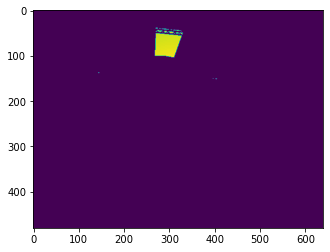

In [7]:
images_and_depths = zip(file_list_images, file_list_depths)


In [8]:
images.shape

NameError: name 'images' is not defined

(array([[480.,   0.,   0., ...,   0.,   0.,   0.],
        [480.,   0.,   0., ...,   0.,   0.,   0.],
        [480.,   0.,   0., ...,   0.,   0.,   0.],
        ...,
        [480.,   0.,   0., ...,   0.,   0.,   0.],
        [480.,   0.,   0., ...,   0.,   0.,   0.],
        [480.,   0.,   0., ...,   0.,   0.,   0.]]),
 array([1.20996094e+00, 1.71468896e+03, 3.42816797e+03, 5.14164697e+03,
        6.85512598e+03, 8.56860547e+03, 1.02820840e+04, 1.19955625e+04,
        1.37090420e+04, 1.54225215e+04, 1.71360000e+04], dtype=float32),
 <a list of 640 BarContainer objects>)

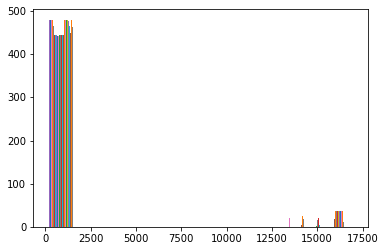

In [16]:
plt.hist(dataset_depths[70])